In [5]:
import os
from os import makedirs
from os.path import join

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from librosa import load
from librosa.display import specshow
from librosa.feature import melspectrogram
from soundfile import write
from tensorflow.keras.models import Model, load_model

import utils.constants as consts
from ai_tools import ModelFilterAmplifier
from utils.audio_tools import create_audio_player
from utils.displays import display_mel_spectrogram

# Only log errors.
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

PATH_TO_MODEL: str = '../models/model_72/epoch-62.pb'
PATH_TO_AUDIO: str = '../long-audio/break_beat_2.wav'
OUTPUT_DIR: str = '../feature_visualization'

makedirs(OUTPUT_DIR, exist_ok=True)
makedirs(join(OUTPUT_DIR, 'mel_specs'), exist_ok=True)

### Load model and audio sample.

Audio is a royalty free rendition of "Calir de Lune" by Debussy.

<Figure size 432x288 with 0 Axes>

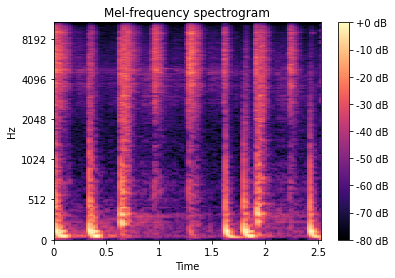

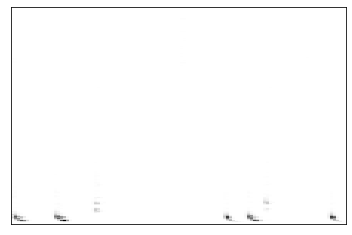

In [6]:
# Load model and sample.
model: Model = load_model(PATH_TO_MODEL)
sample: np.ndarray = load(PATH_TO_AUDIO)[0]
# sample: np.ndarray = np.random.uniform(size=(consts.SAMPLE_RATE * 3,))  # Random noise generator.
# sample: np.ndarray = tone(2, duration=3.0, sr=consts.SAMPLE_RATE)

create_audio_player(sample, normalize=True)

encoded_sample: np.ndarray = melspectrogram(
    y=sample,
    sr=consts.SAMPLE_RATE,
    n_fft=consts.NUM_FFT,
    hop_length=consts.MEL_HOP_LEN,
    n_mels=consts.NUM_MELS,
    win_length=consts.MEL_WINDOW_LEN
)

display_mel_spectrogram(encoded_sample)

# Write audio file.
write(join(OUTPUT_DIR, 'input_audio') + '.wav', sample, samplerate=consts.SAMPLE_RATE)

# Write mel spectrogram to file.
specshow(encoded_sample, sr=consts.SAMPLE_RATE, cmap='binary')
plt.savefig(join(OUTPUT_DIR, 'mel_specs', 'input_audio' + '.png'))

### Model architecture

In [7]:
model.summary()

Model: "model_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_40 (InputLayer)       [(None, 300, 44, 1)]      0         
                                                                 
 batch_norm (LayerNormalizat  (None, 300, 44, 1)       88        
 ion)                                                            
                                                                 
 conv_block_0 (Conv2D)       (None, 300, 44, 69)       1173      
                                                                 
 pooling_0 (MaxPooling2D)    (None, 150, 22, 69)       0         
                                                                 
 batch_norm_0 (BatchNormaliz  (None, 150, 22, 69)      276       
 ation)                                                          
                                                                 
 conv_dropout0 (Dropout)     (None, 150, 22, 69)       0  

<Figure size 432x288 with 0 Axes>

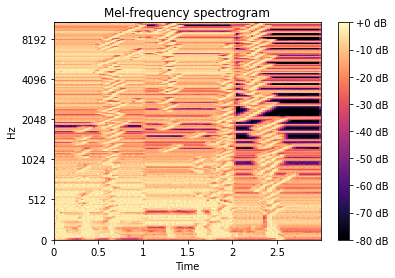

<Figure size 432x288 with 0 Axes>

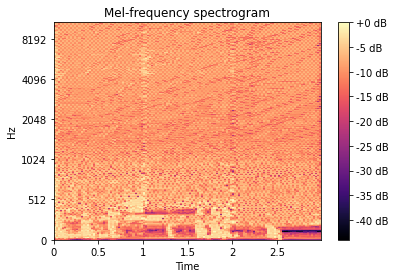

<Figure size 432x288 with 0 Axes>

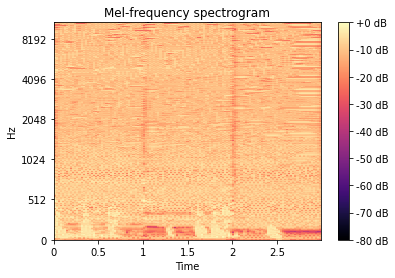

<Figure size 432x288 with 0 Axes>

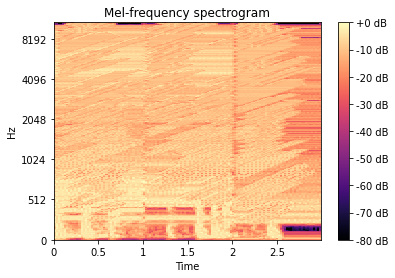

<Figure size 432x288 with 0 Axes>

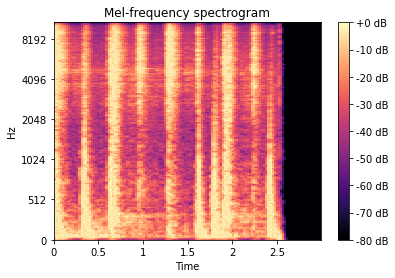

<Figure size 432x288 with 0 Axes>

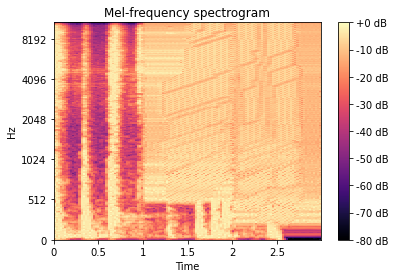

<Figure size 432x288 with 0 Axes>

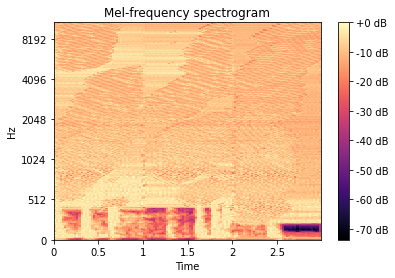

<Figure size 432x288 with 0 Axes>

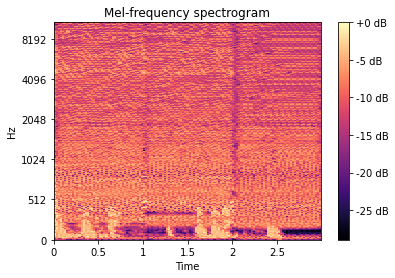

<Figure size 432x288 with 0 Axes>

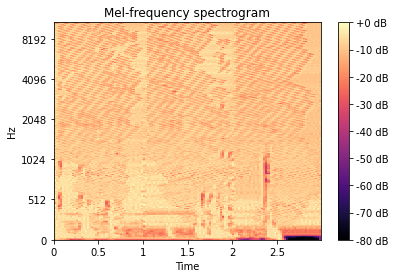

<Figure size 432x288 with 0 Axes>

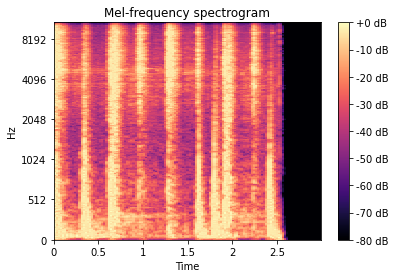

<Figure size 432x288 with 0 Axes>

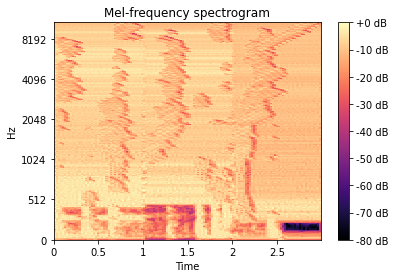

<Figure size 432x288 with 0 Axes>

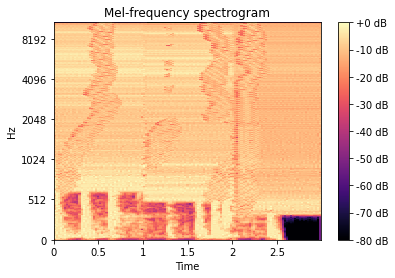

<Figure size 432x288 with 0 Axes>

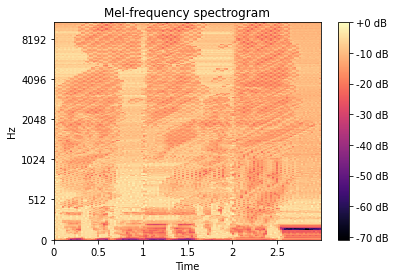

<Figure size 432x288 with 0 Axes>

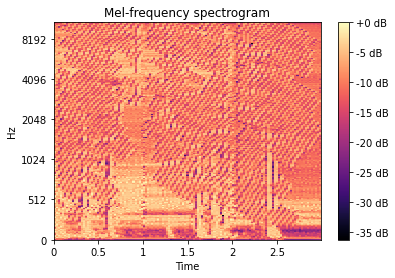

<Figure size 432x288 with 0 Axes>

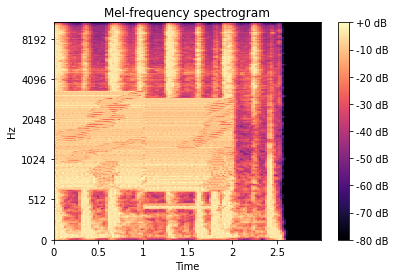

<Figure size 432x288 with 0 Axes>

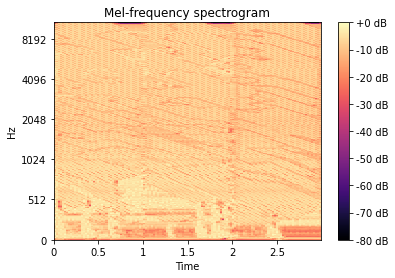

<Figure size 432x288 with 0 Axes>

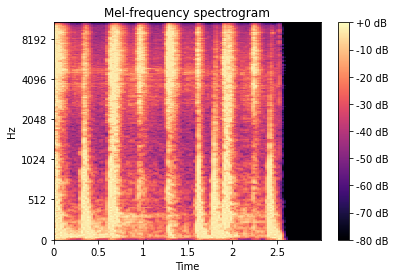

<Figure size 432x288 with 0 Axes>

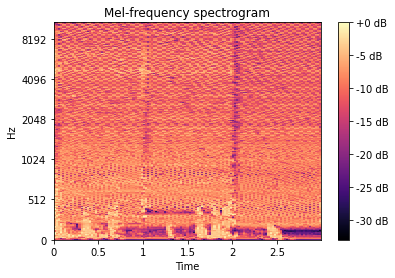

<Figure size 432x288 with 0 Axes>

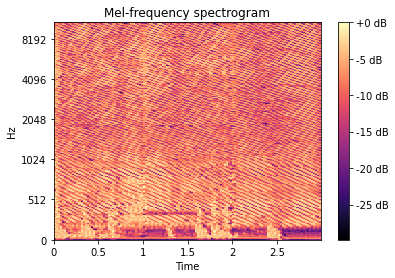

<Figure size 432x288 with 0 Axes>

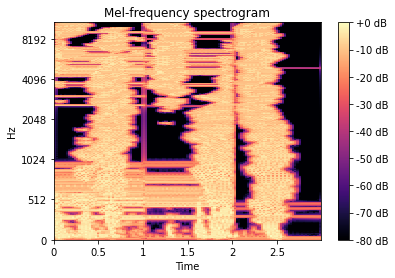

<Figure size 432x288 with 0 Axes>

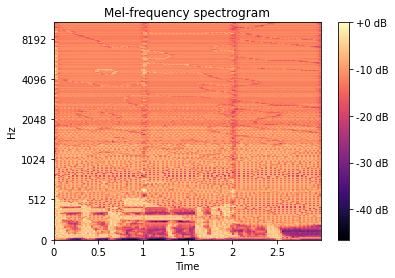

<Figure size 432x288 with 0 Axes>

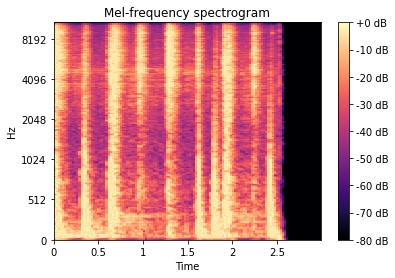

<Figure size 432x288 with 0 Axes>

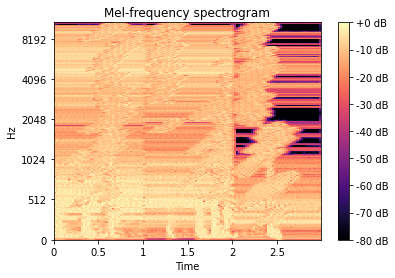

<Figure size 432x288 with 0 Axes>

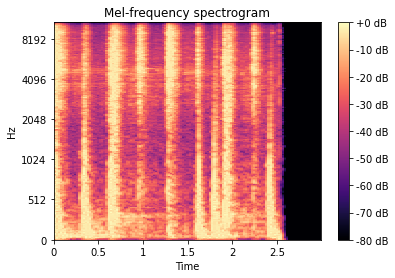

<Figure size 432x288 with 0 Axes>

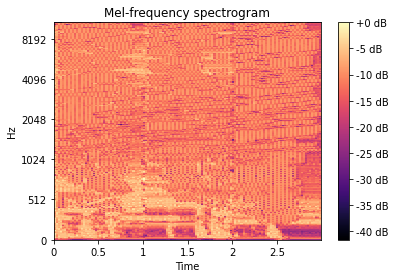

<Figure size 432x288 with 0 Axes>

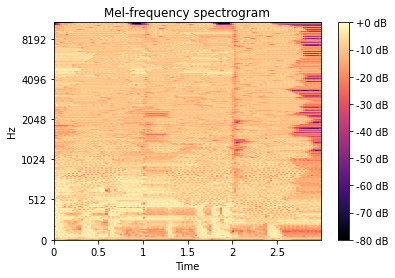

<Figure size 432x288 with 0 Axes>

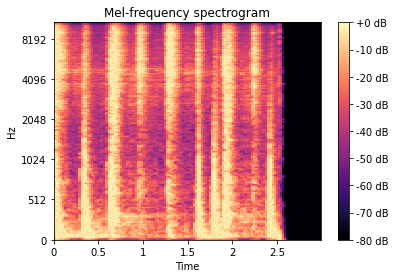

<Figure size 432x288 with 0 Axes>

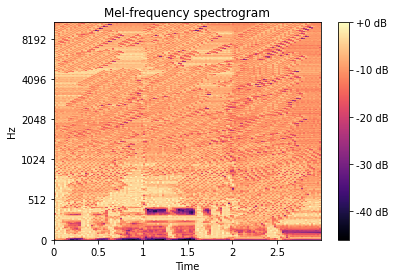

<Figure size 432x288 with 0 Axes>

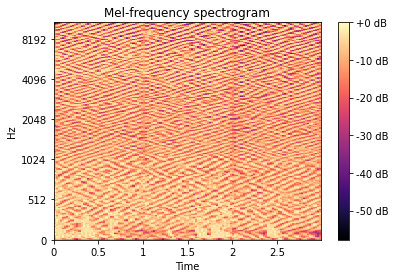

<Figure size 432x288 with 0 Axes>

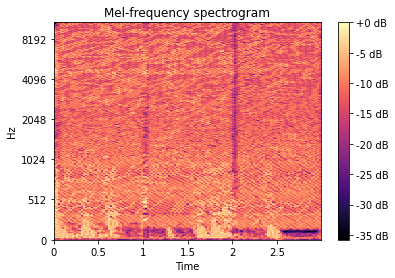

<Figure size 432x288 with 0 Axes>

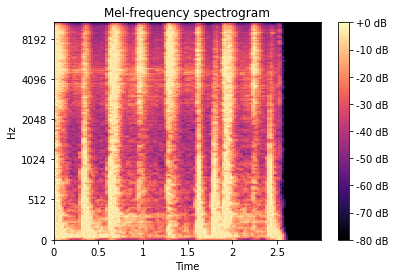

<Figure size 432x288 with 0 Axes>

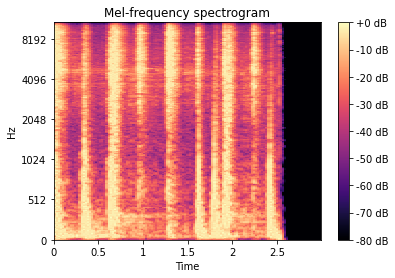

<Figure size 432x288 with 0 Axes>

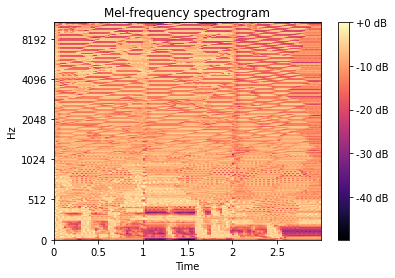

<Figure size 432x288 with 0 Axes>

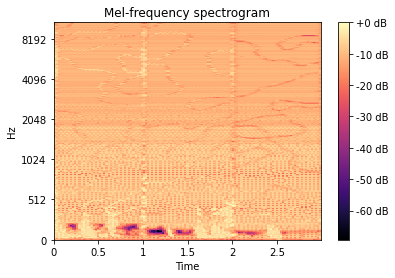

<Figure size 432x288 with 0 Axes>

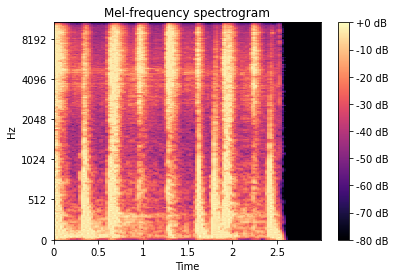

<Figure size 432x288 with 0 Axes>

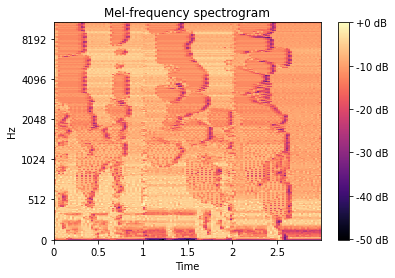

KeyboardInterrupt: 

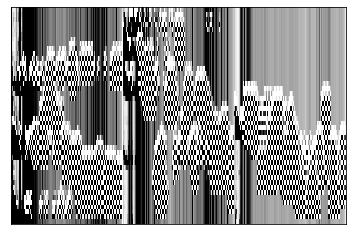

In [10]:
model_filter_amplifier = ModelFilterAmplifier(model, padding_amount=2, layer=0)

# sample = sample.reshape()

for neuron_i in range(68):
    audio_signal, mel_spec = model_filter_amplifier(
        sample,
        filter_index=neuron_i,
        iterations=100,
        filter_amount=0,  # Mild high cut. 0 is no filtering, 1 is completely closed filter.
        cross_fade_time=0.9
    )  # type: np.ndarray, np.ndarray

    neuron_name: str = f'neuron_{neuron_i}'

    create_audio_player(audio_signal * 2)

    encoded_signal: np.ndarray = melspectrogram(
        y=audio_signal,
        sr=consts.SAMPLE_RATE,
        n_fft=consts.NUM_FFT,
        hop_length=consts.MEL_HOP_LEN,
        n_mels=consts.NUM_MELS,
        win_length=consts.MEL_WINDOW_LEN
    )

    display_mel_spectrogram(encoded_signal)

    # Write audio file.
    write(join(OUTPUT_DIR, neuron_name) + '.wav', audio_signal, samplerate=consts.SAMPLE_RATE)

    # Write mel spectrogram to file.
    specshow(mel_spec.T, sr=consts.SAMPLE_RATE, cmap='binary')
    plt.savefig(join(OUTPUT_DIR, 'mel_specs', neuron_name + '.png'))